In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from scipy import stats

from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from statsmodels.tsa.seasonal import seasonal_decompose

# Loading the cleaned dataframe
df = pd.read_csv('data_2018_2023_chl_sst_sswh_clean.csv')

# Converting 'time' column to datetime
df['time'] = pd.to_datetime(df['time'])
df['date'] = df['time'].dt.date
df['day'] = df['time'].dt.day
df['month'] = df['time'].dt.month
df['year'] = df['time'].dt.year

# Checking for any missing values
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

# Summary statistics
summary_stats = df.describe()
print(summary_stats)

stats_chl = df['chl'].describe()
print(stats_chl)

Missing Values:
 time                0
VHM0                0
VTM02               0
VTM10               0
VMDR                0
VPED                0
VTPK                0
VCMX                0
VMXL                0
VHM0_WW             0
VHM0_SW1            0
VHM0_SW2            0
VMDR_WW             0
VMDR_SW1            0
VMDR_SW2            0
VTM01_WW            0
VTM01_SW1           0
VTM01_SW2           0
VSDX                0
VSDY                0
analysed_sst        0
analysis_error      0
mask                0
sea_ice_fraction    0
longitude           0
latitude            0
depth               0
po4                 0
phyc                0
si                  0
nh4                 0
chl                 0
fe                  0
no3                 0
nppv                0
zeu                 0
o2                  0
spco2               0
dissic              0
ph                  0
date                0
day                 0
month               0
year                0
dtype: int64
  

# Target: chl

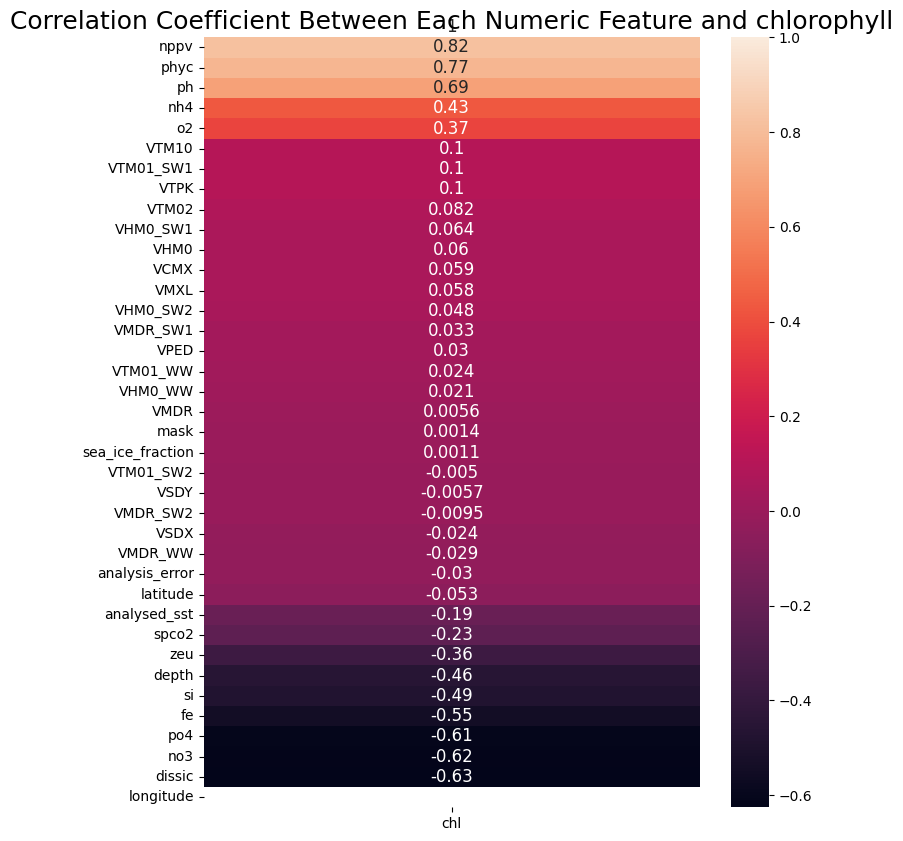

In [2]:
# Selecting only numeric columns for correlation
numeric_df = df.select_dtypes(include=['float64'])

# Calculating correlation with 'ysi_chlorophyll'
correlation = numeric_df.corr()[['chl']].sort_values('chl', ascending=False)

# Visualizing correlation coefficients between features and cancellation
fig = plt.figure(figsize=(8,10))
ax = sns.heatmap(correlation, annot=True, annot_kws={"size":12})
ax.set_title('Correlation Coefficient Between Each Numeric Feature and chlorophyll', fontsize=18)

y_min, y_max = ax.get_ylim()
ax.set_ylim(top=y_max+1);    

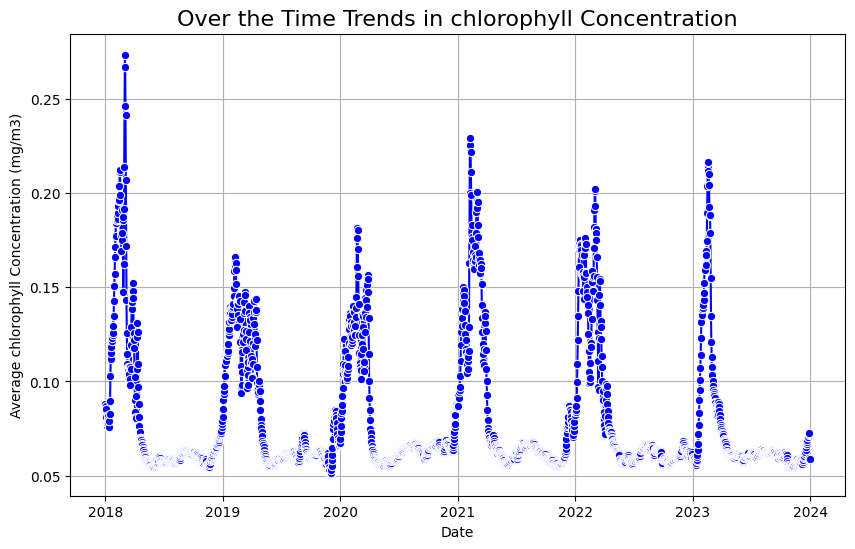

In [3]:
# Grouping data by date and calculate average
avg = df.groupby('date')['chl'].mean()

# Plot trends
plt.figure(figsize=(10, 6))
sns.lineplot(x=avg.index, y=avg.values, marker='o', color='blue')
plt.title('Over the Time Trends in chlorophyll Concentration', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Average chlorophyll Concentration (mg/m3)')
plt.grid()
plt.show()

There are clear annual peaks in chlorophyll-a concentration between 2018 and 2024. They typically occur at the same time each year, indicating seasonally driven algal bloom cycles.

Maximum chlorophyll-a concentrations exceed 0.25 mg/m³ during bloom events. Minimum levels range around 0.05–0.07 mg/m³, corresponding to periods of low phytoplankton activity.

The peaks are likely triggered by favorable conditions, such as:
- Increased sea surface temperature (SST) in warm seasons.
- Higher nutrient availability (e.g., nitrate, phosphate, iron).
- Stable water column stratification, limiting vertical mixing.

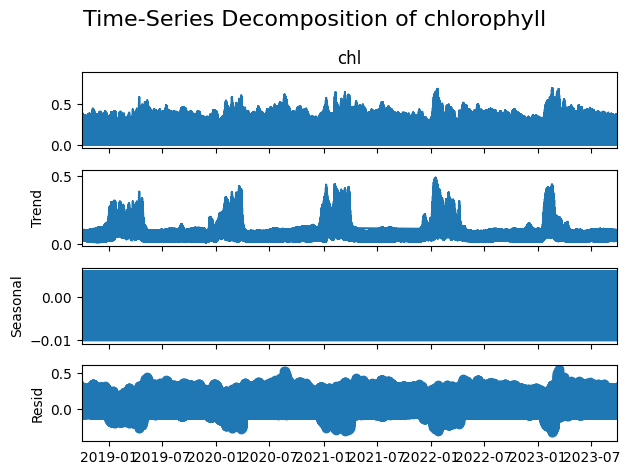

In [4]:
df.set_index('time', inplace=True)
decomposed = seasonal_decompose(df['chl'], model='additive', period=30)

# Plotting the decomposition
decomposed.plot()
plt.suptitle('Time-Series Decomposition of chlorophyll', fontsize=16)
plt.tight_layout()
plt.show()

Observed Series (First Plot)
- Displays recurrent peaks and troughs across the years, confirming seasonal algal bloom cycles.

Trend Component (Second Plot)
- Distinct peaks correspond to major bloom events occurring almost annually.
- Some interannual variability in bloom magnitude is evident, with higher peaks around 2020–2021 and slightly reduced intensity in later years.

Seasonal Component (Third Plot)
- Almost flat with very low amplitude, suggesting that the decomposition method failed to extract a clear seasonal pattern.

This could be due to the strong dominance of irregular peaks (blooms) over regular seasonal cycles or possible limitations in the decomposition method or the time window chosen for analysis.

Residual Component (Last Plot)
- Irregular fluctuations not captured by trend or seasonal components.
- High variability indicates episodic events (e.g., storms, nutrient upwelling, or short-term physical disturbances) affecting chlorophyll levels.
- Noticeable large deviations during bloom peaks, implying strong local environmental variability.

# Time series Analysis

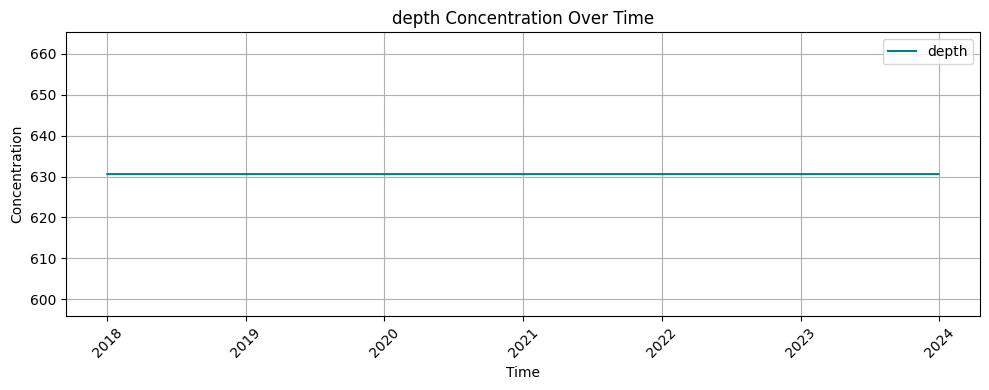

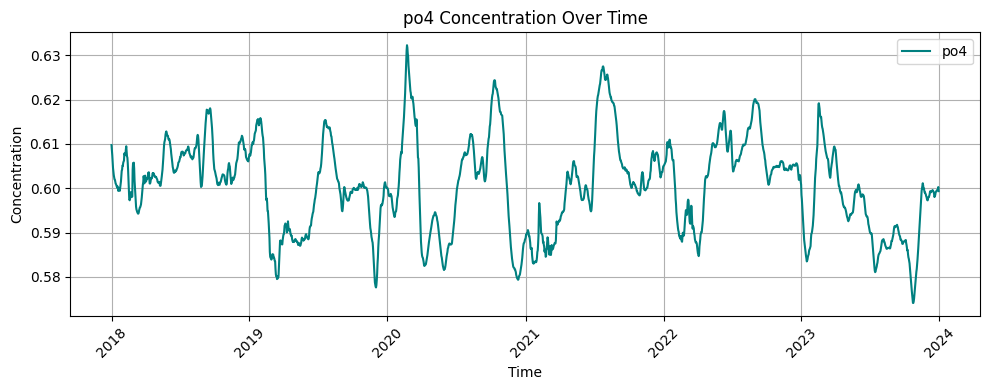

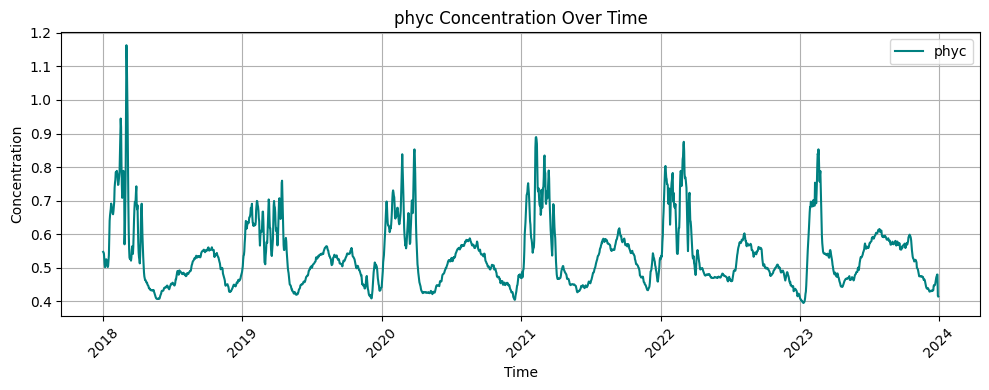

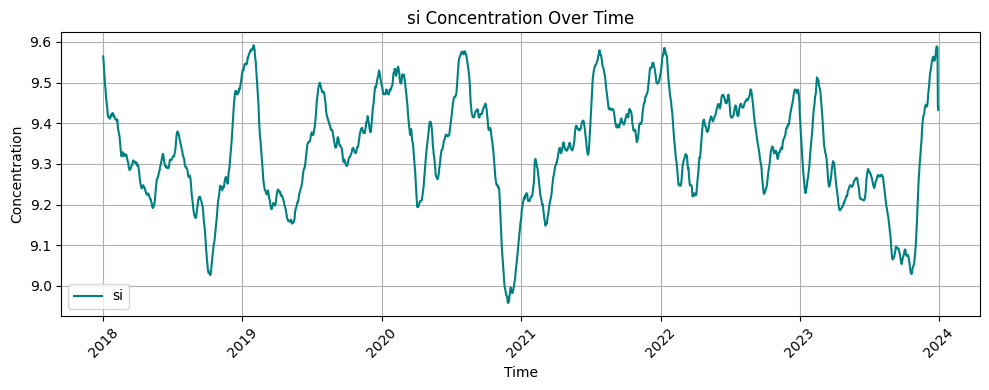

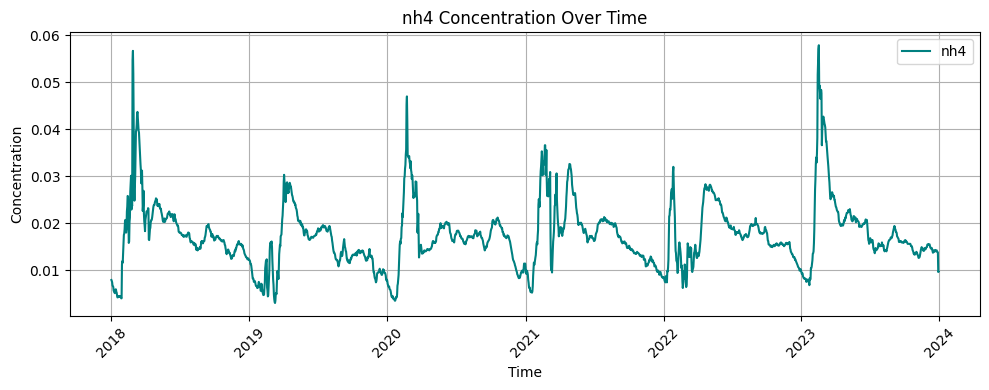

...

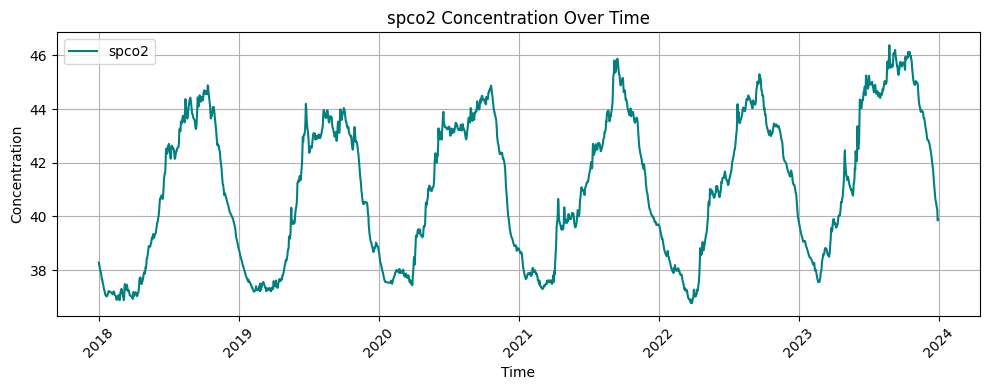

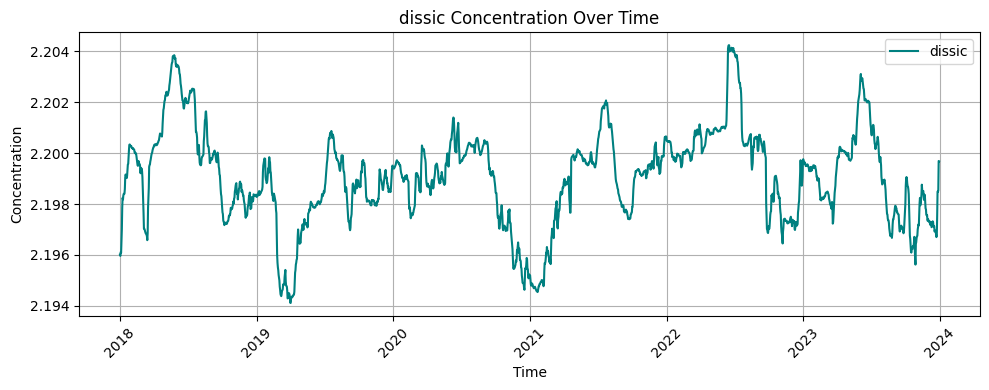

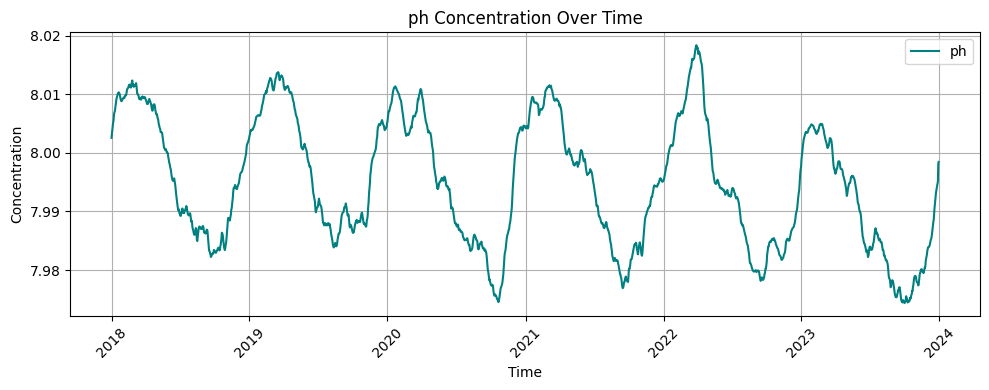

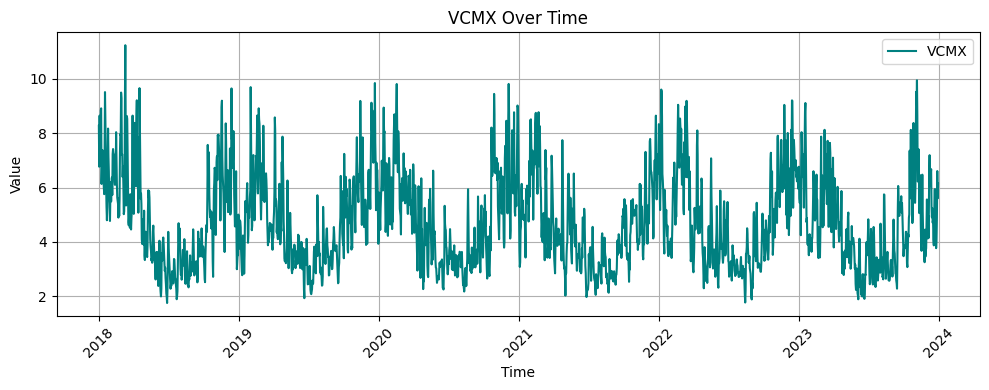

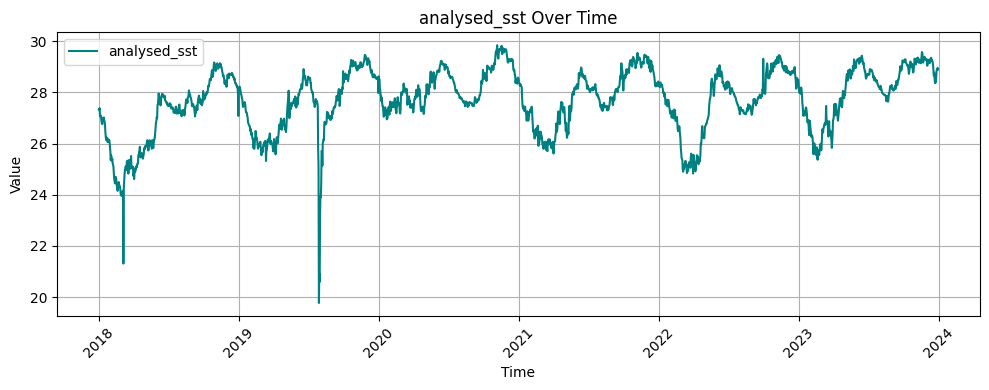

In [5]:
nutrient_columns = ['depth', 'po4', 'phyc', 'si', 'nh4', 'chl', 'fe', 'no3', 'nppv', 'zeu', 'o2', 'spco2', 'dissic', 'ph']
weather_columns = ['VCMX', 'analysed_sst']

# Aggregating by time
time_series = df.groupby('time')[['chl'] + nutrient_columns].mean()
time_series_2 = df.groupby('time')[weather_columns].mean()

# Plot each nutrient individually over time
for col in nutrient_columns:
    plt.figure(figsize=(10, 4))
    plt.plot(time_series.index, time_series[col], label=col, color='teal')
    plt.xlabel("Time")
    plt.ylabel("Concentration")
    plt.title(f"{col} Concentration Over Time")
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Plot each weather variable individually over time
for col in weather_columns:
    plt.figure(figsize=(10, 4))
    plt.plot(time_series_2.index, time_series_2[col], label=col, color='teal')
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title(f"{col} Over Time")
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

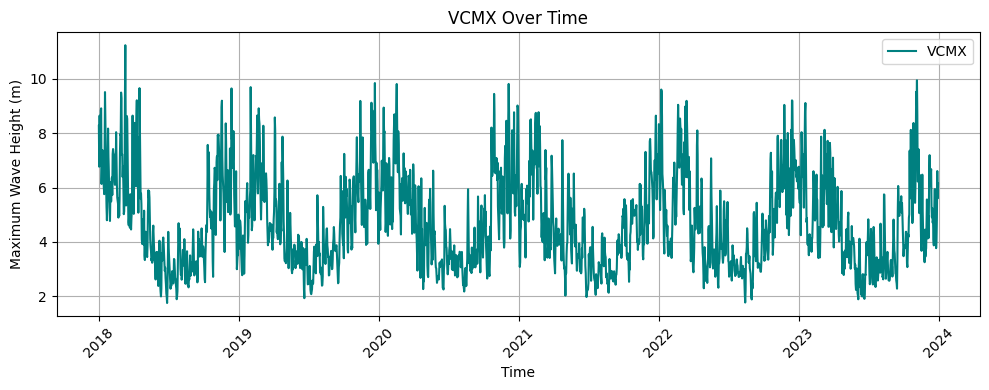

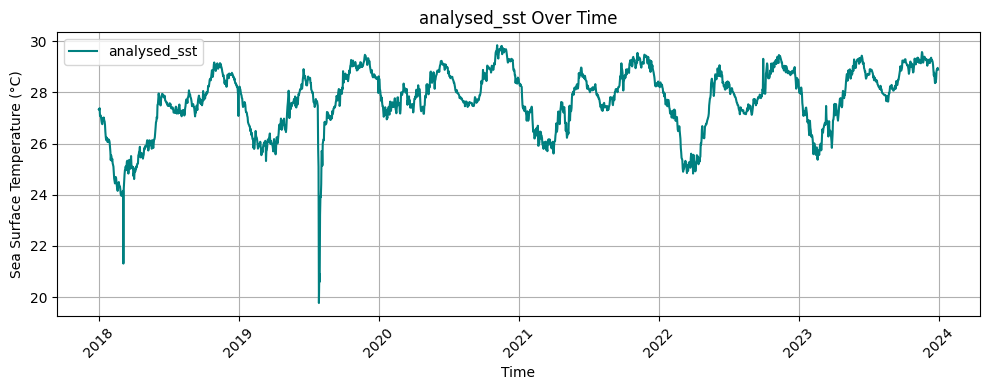

In [6]:
# Custom labels for weather variables
weather_labels = {
    'analysed_sst': 'Sea Surface Temperature (°C)',
    'VCMX': 'Maximum Wave Height (m)'
}

# Plot each weather variable individually
for col in weather_columns:
    plt.figure(figsize=(10, 4))
    plt.plot(time_series_2.index, time_series_2[col], label=col, color='teal')
    plt.xlabel("Time")
    plt.ylabel(weather_labels[col])
    plt.title(f"{col} Over Time")
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

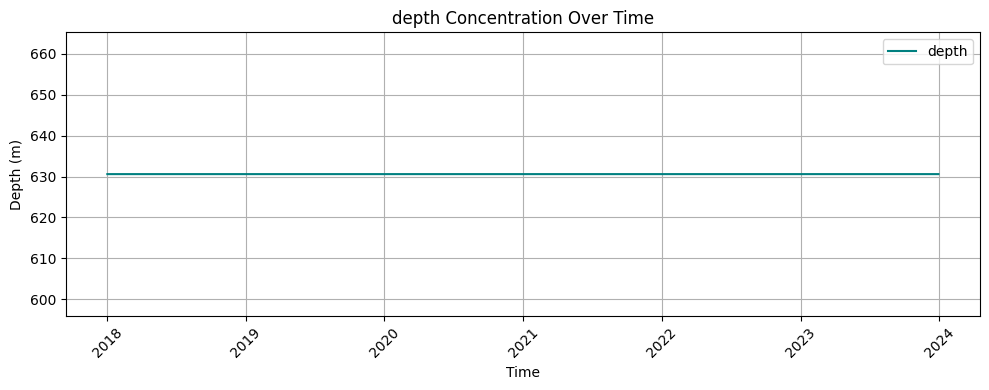

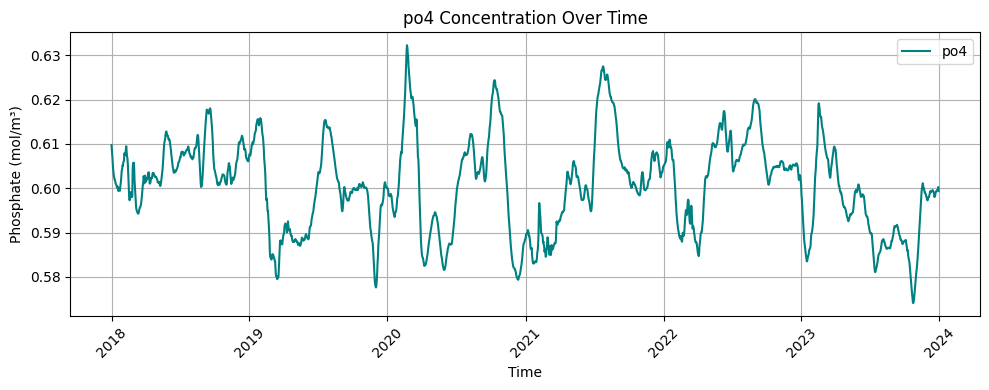

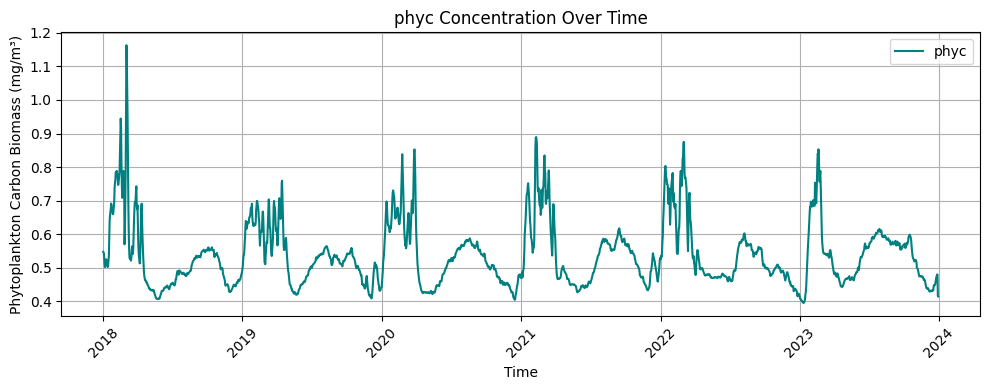

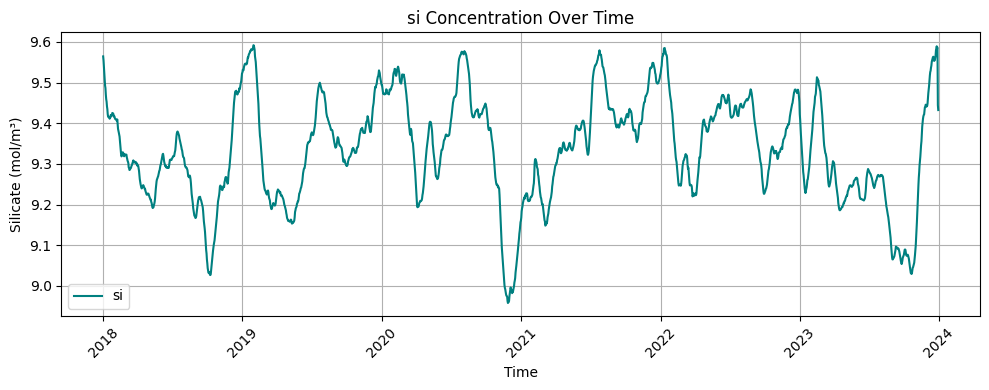

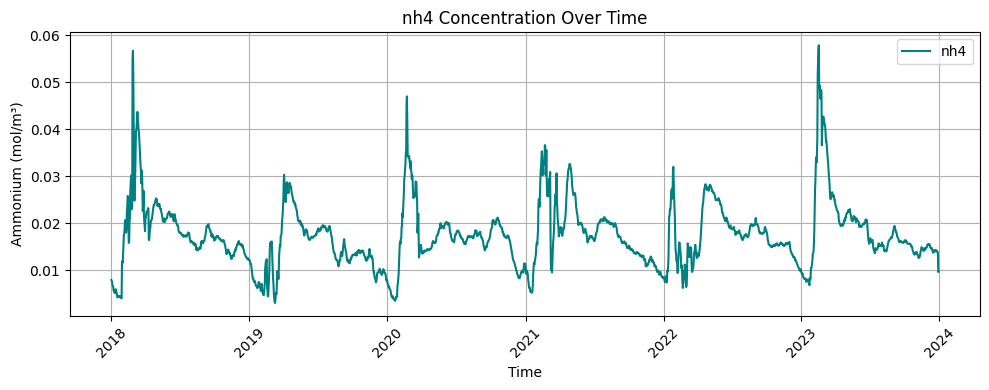

...

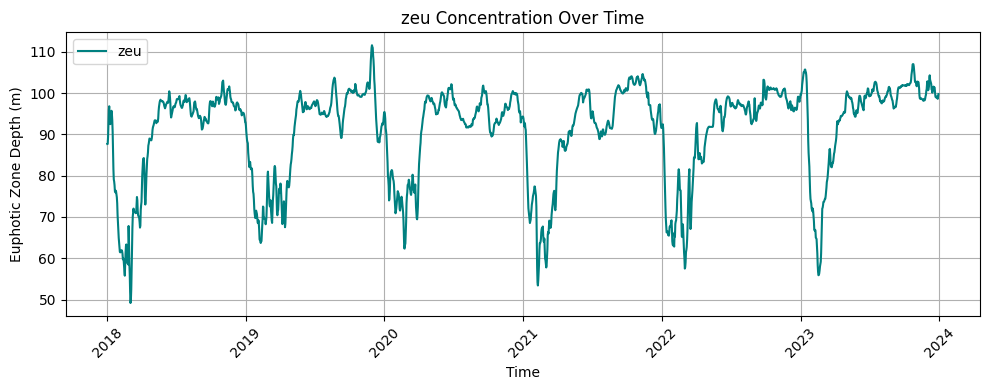

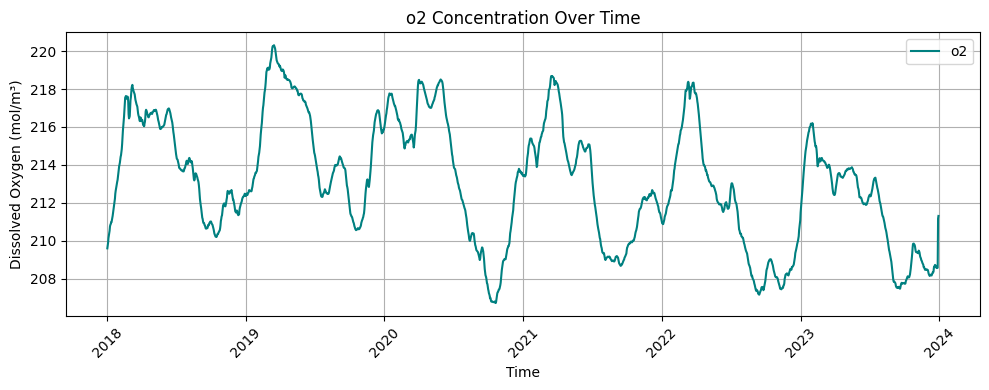

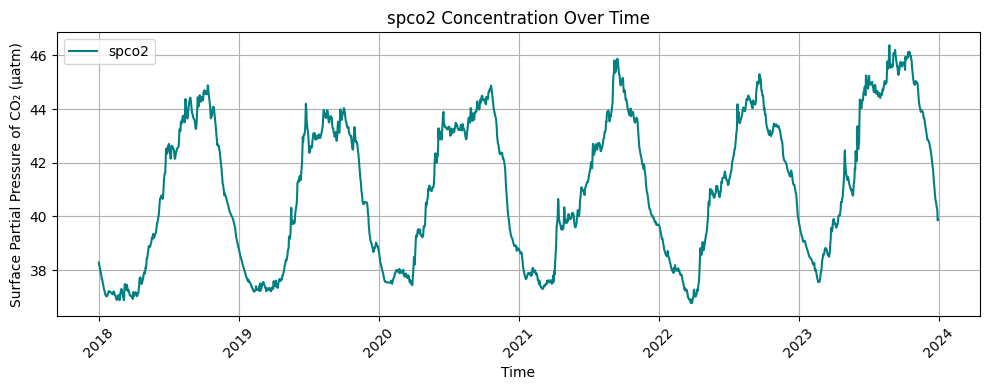

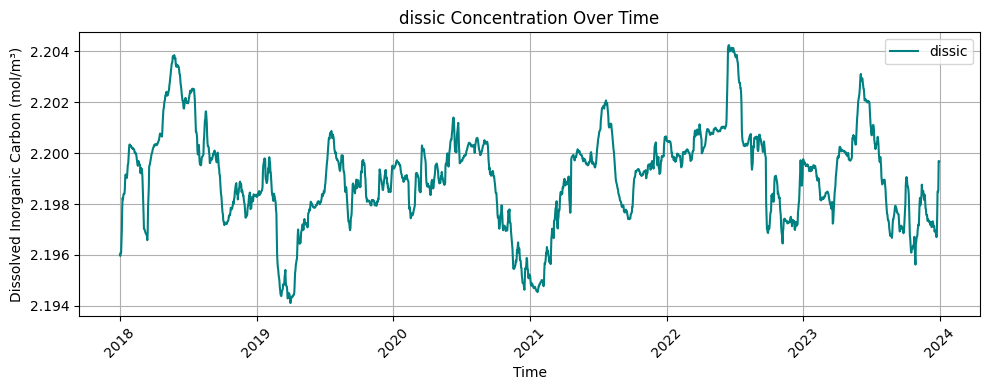

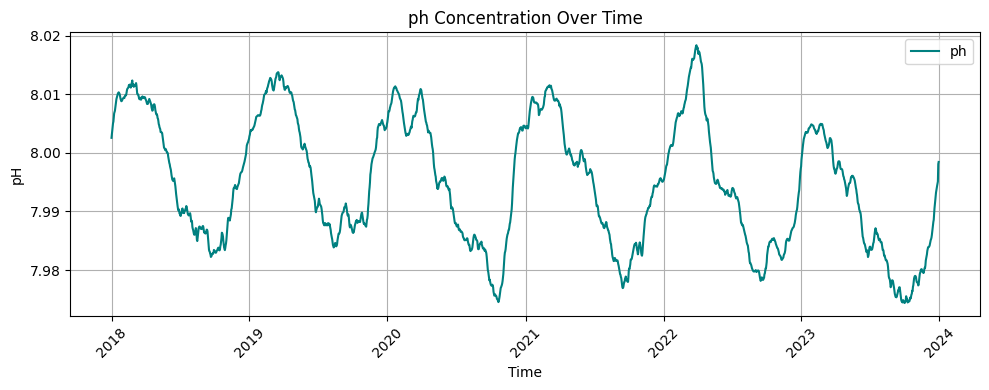

In [7]:
# Custom labels for nutrient variables
nutrient_labels = {
    'depth': 'Depth (m)',
    'po4': 'Phosphate (mol/m³)',
    'phyc': 'Phytoplankton Carbon Biomass (mg/m³)',
    'si': 'Silicate (mol/m³)',
    'nh4': 'Ammonium (mol/m³)',
    'chl': 'Chlorophyll-a (mg/m³)',
    'fe': 'Iron (mol/m³)',
    'no3': 'Nitrate (mol/m³)',
    'nppv': 'Net Primary Production (mg/m³/day)',
    'zeu': 'Euphotic Zone Depth (m)',
    'o2': 'Dissolved Oxygen (mol/m³)',
    'spco2': 'Surface Partial Pressure of CO₂ (µatm)',
    'dissic': 'Dissolved Inorganic Carbon (mol/m³)',
    'ph': 'pH'
}

# Plot each nutrient variable individually
for col in nutrient_columns:
    plt.figure(figsize=(10, 4))
    plt.plot(time_series.index, time_series[col], label=col, color='teal')
    plt.xlabel("Time")
    plt.ylabel(nutrient_labels[col])
    plt.title(f"{col} Concentration Over Time")
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

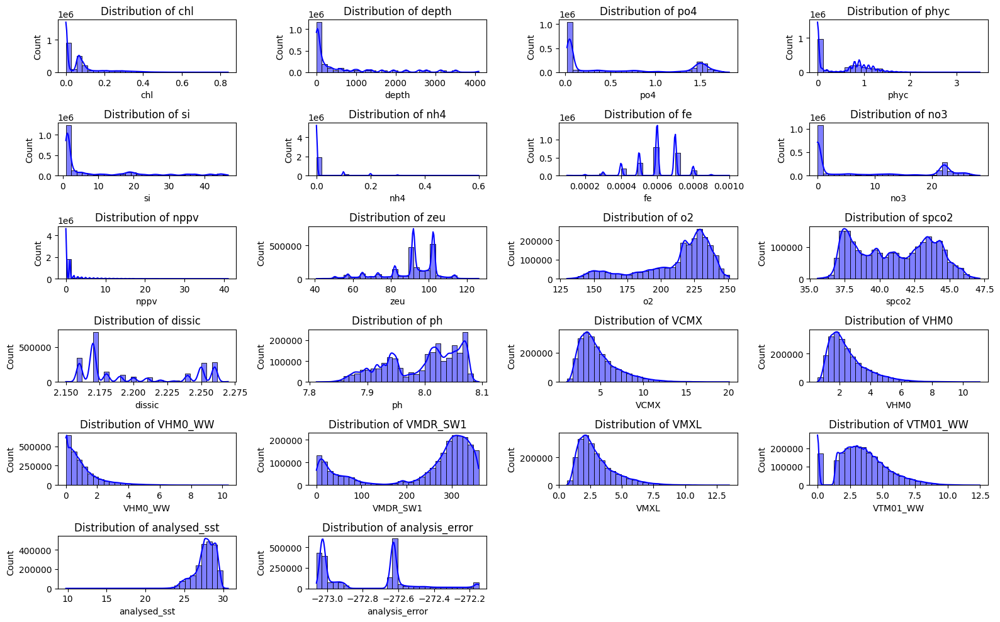

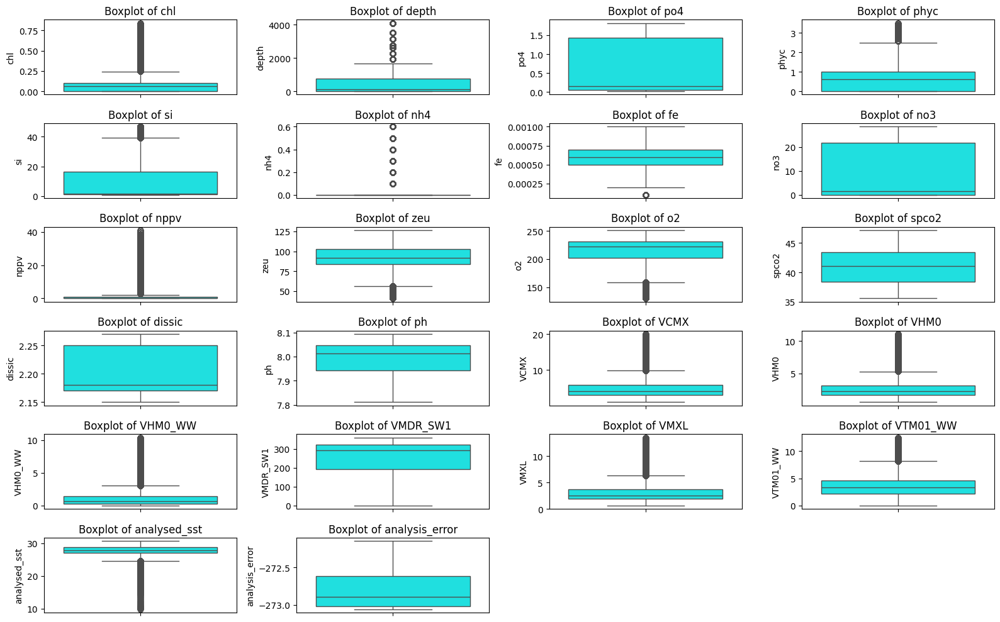

In [8]:
# Selecting key environmental variables for analysis
key_variables = ['chl', 'depth', 'po4', 'phyc', 'si', 'nh4', 'fe', 'no3', 'nppv', 'zeu', 'o2', 'spco2', 'dissic', 'ph', 
                 'VCMX', 'VHM0', 'VHM0_WW', 'VMDR_SW1', 'VMXL', 'VTM01_WW', 'analysed_sst', 'analysis_error']

# Histograms & KDE plots
plt.figure(figsize=(16, 10))
for i, feature in enumerate(key_variables, 1):
    plt.subplot(6, 4, i)
    sns.histplot(df[feature], bins=30, kde=True, color="blue")
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

# Boxplots to detect outliers
plt.figure(figsize=(16, 10))
for i, feature in enumerate(key_variables, 1):
    plt.subplot(6, 4, i)
    sns.boxplot(y=df[feature], color="cyan")
    plt.title(f'Boxplot of {feature}')
plt.tight_layout()
plt.show()

# Removing Outliers

In [9]:
# # https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.zscore.html
# # Selecting only numerical columns
# num_cols = ['chl', 'depth', 'phyc', 'si', 'nh4', 'fe', 'nppv', 'zeu', 'o2', 'VCMX', 'VHM0', 'VHM0_WW', 'VMXL', 'VTM01_WW', 'analysed_sst']

# # Defining Zscore threshold
# threshold_z = 3

# # Compute the Z-score for each column and filter out extreme values
# df_no_outliers = df[(abs(stats.zscore(df[num_cols])) < threshold_z).all(axis=1)]

# # Reset index to bring back 'time' as a column
# df_no_outliers = df_no_outliers.reset_index()

# # Standardization (Z-score normalization: mean = 0, std = 1)
# standard_scaler = StandardScaler()
# df_cleaned = df_no_outliers.copy()
# df_cleaned[num_cols] = standard_scaler.fit_transform(df_no_outliers[num_cols])

# print("Before outlier removal - Shape:", df.shape)
# print("After outlier removal - Shape:", df_cleaned.shape)

# df_cleaned.to_csv('data_2018_2023_chl_sst_sswh_clean_outliers.csv', index=False)

In [10]:
# # Boxplots to detect outliers
# plt.figure(figsize=(16, 10))
# for i, feature in enumerate(key_variables, 1):
#     plt.subplot(6, 4, i)
#     sns.boxplot(y=df_cleaned[feature], color="cyan")
#     plt.title(f'Boxplot of {feature}')
# plt.tight_layout()
# plt.show()

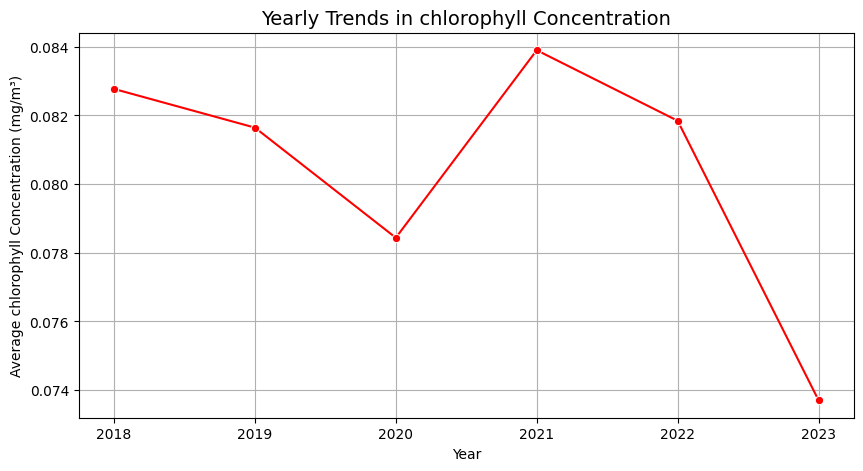

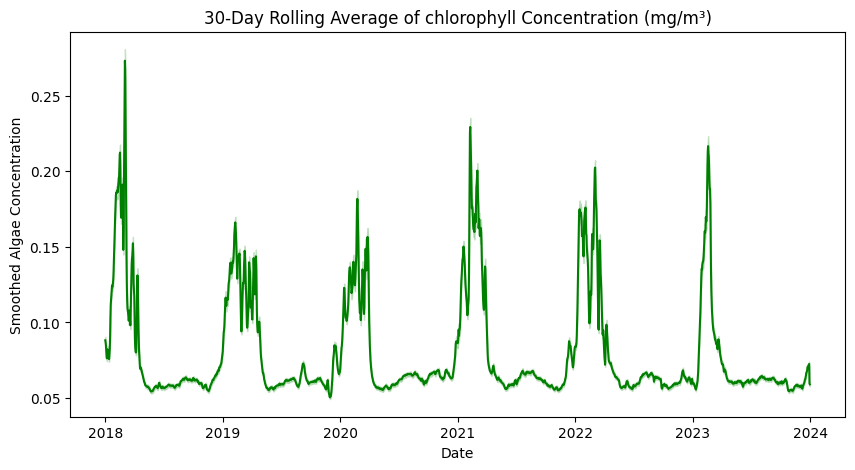

In [11]:
# Computing yearly averages
yearly_avg = df.groupby('year')['chl'].mean()

# Plot weekly trends
plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_avg.index, y=yearly_avg.values, marker='o', color='red')
plt.title('Yearly Trends in chlorophyll Concentration', fontsize=14)
plt.xlabel('Year')
plt.ylabel('Average chlorophyll Concentration (mg/m³)')
plt.grid()
plt.show()

# Computing rolling average for trend smoothing (30-day window)
df['rolling_avg'] = df['chl'].rolling(window=30, min_periods=1).mean()

# Plot rolling average trend
plt.figure(figsize=(10, 5))
sns.lineplot(x=df.index, y=df['rolling_avg'], color='green')
plt.title('30-Day Rolling Average of chlorophyll Concentration (mg/m³)')
plt.xlabel('Date')
plt.ylabel('Smoothed Algae Concentration')
plt.show()

#### Yearly Trends in chlorophyll Concentration

The yearly trends in chlorophyll-a concentration reveal moderate interannual variability, with the highest average values observed in 2021 (\~0.084 mg/m³) and a progressive decline reaching the lowest levels in 2023 (\~0.074 mg/m³). This pattern suggests that while phytoplankton productivity generally follows a stable long-term trend, bloom intensity is influenced by interannual fluctuations in environmental drivers such as sea surface temperature, nutrient availability, and ocean dynamics. The marked peak in 2021 likely reflects optimal growth conditions, whereas the subsequent decline may indicate less favorable physical or chemical conditions, supporting the hypothesis that chlorophyll-a variability is driven by complex interactions between biogeochemical and climatic factors rather than purely seasonal cycles.

#### 30-Day Rolling Average of chlorophyll Concentration

The 30-day rolling average of chlorophyll-a concentration highlights clear seasonal bloom patterns, with distinct annual peaks occurring between 2018 and 2023. The highest peak is observed in early 2018 (>0.25 mg/m³), followed by slightly lower but consistent yearly maxima ranging from \~0.15 to 0.22 mg/m³. These peaks correspond to periods of enhanced phytoplankton growth under favorable environmental conditions, while the low baseline concentrations (\~0.05–0.07 mg/m³) between peaks indicate non-bloom periods. The smoothed trend confirms the strong seasonal cycle of algal blooms, with interannual variability in bloom intensity likely influenced by fluctuations in sea surface temperature, nutrient availability, and hydrodynamic stability.

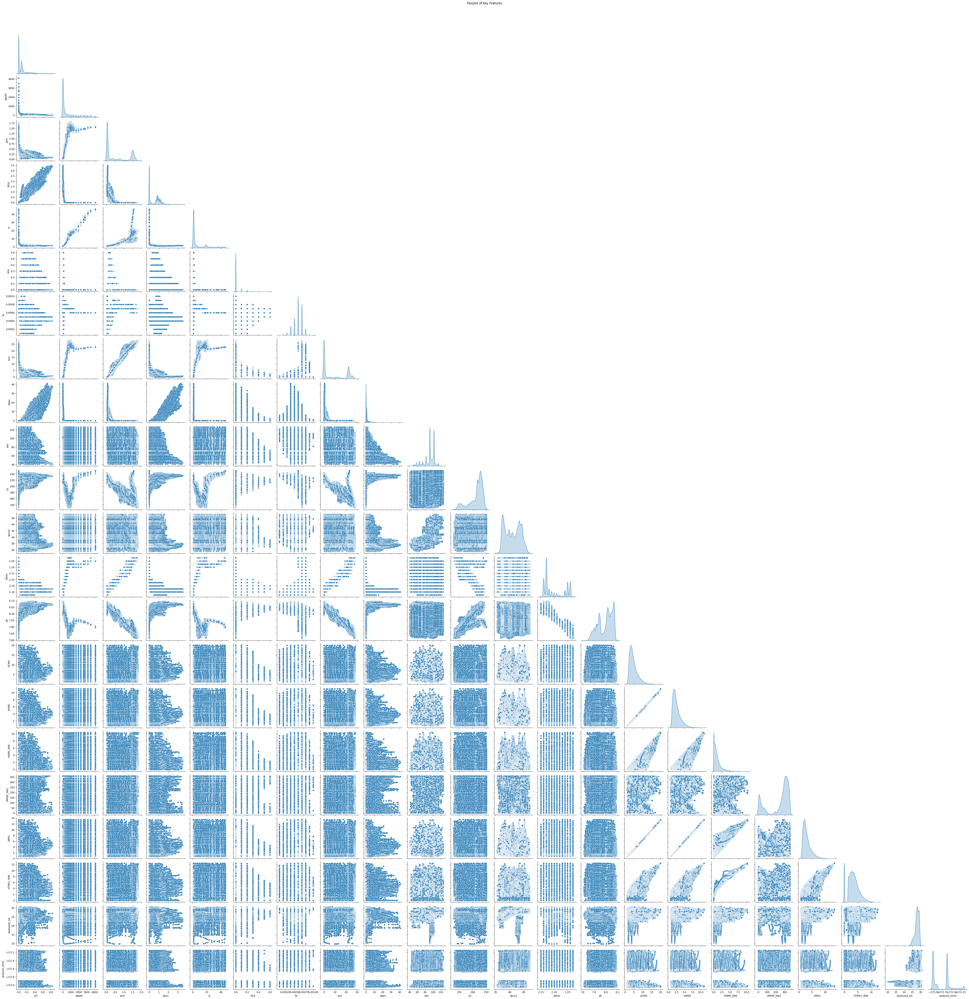

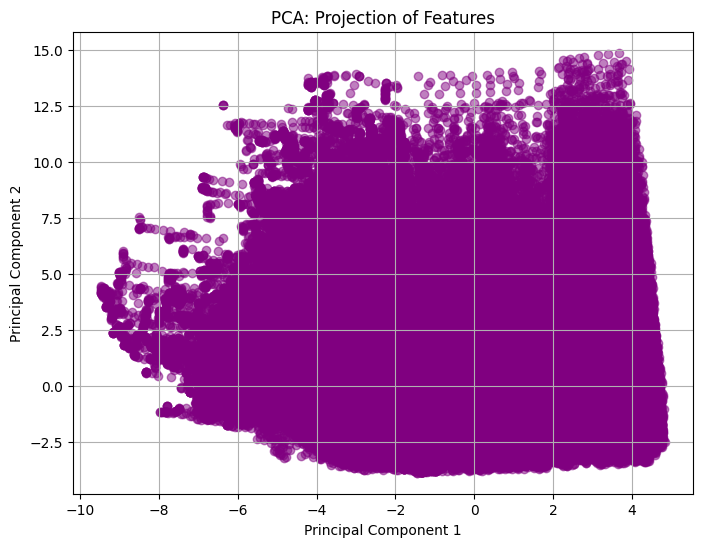

Explained variance by components: [0.3305393  0.21029865]


In [12]:
# Pairing plots for visualizing relationships
sns.pairplot(df[key_variables], diag_kind="kde", corner=True)
plt.suptitle("Pairplot of Key Features", y=1.02)
plt.show()

# Principal Component Analysis (PCA) for dimensionality reduction
scaled_data = (df[key_variables] - df[key_variables].mean()) / df[key_variables].std()
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data.dropna())

# Scatter plot of PCA components
plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], alpha=0.5, color='purple')
plt.title("PCA: Projection of Features")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid()
plt.show()

# Displaying explained variance
print(f"Explained variance by components: {pca.explained_variance_ratio_}")

The PCA projection of features illustrates the distribution of data points along the first two principal components, which together capture the most significant variance in the dataset. Most points are densely clustered in a compact region, suggesting strong correlations among environmental and biogeochemical variables. The spread along **Principal Component 1** (ranging from approximately -10 to +4) reflects the dominant source of variance, likely driven by key factors such as chlorophyll-a, net primary productivity, and nutrient concentrations. Meanwhile, **Principal Component 2** (ranging from -3 to +15) accounts for secondary variability, possibly related to physical parameters like sea surface temperature and wave height. The lack of clear separable clusters implies that the relationships between features are continuous rather than discrete, consistent with the complex and dynamic nature of marine ecosystems.


# Distributions of Key Variables

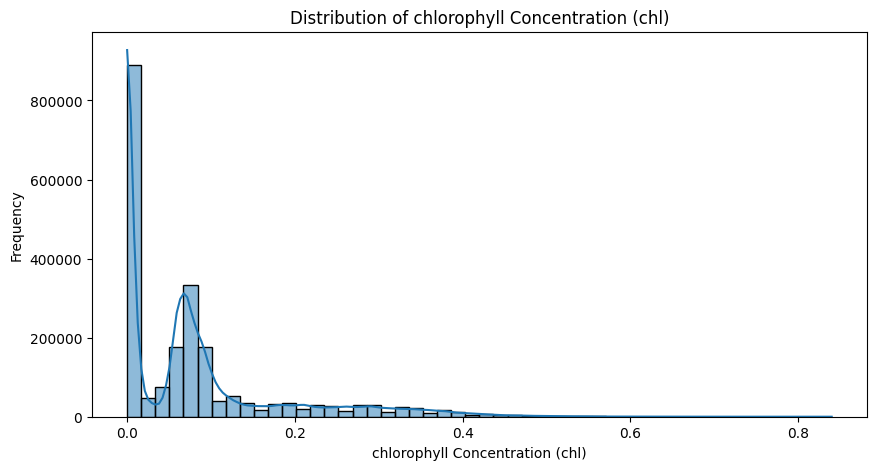

<Figure size 1200x600 with 0 Axes>

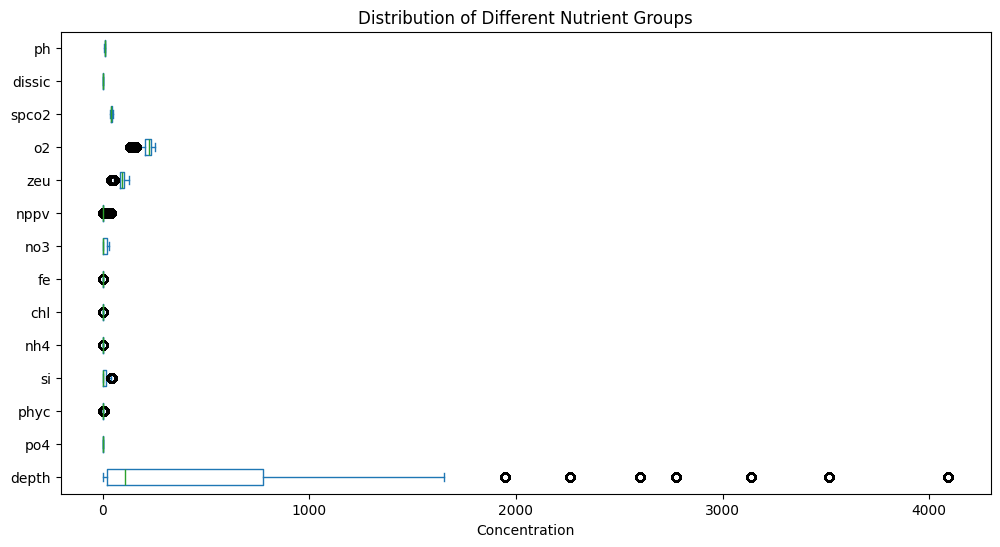

In [16]:
# Plot chl distribution
plt.figure(figsize=(10, 5))
sns.histplot(df['chl'], bins=50, kde=True)
plt.xlabel("chlorophyll Concentration (chl)")
plt.ylabel("Frequency")
plt.title("Distribution of chlorophyll Concentration (chl)")
plt.show()

# Boxplot of nutrient groups
plt.figure(figsize=(12, 6))
nutrient_columns = ['depth', 'po4', 'phyc', 'si', 'nh4', 'chl', 'fe', 'no3', 'nppv', 'zeu', 'o2', 'spco2', 'dissic', 'ph']

df[nutrient_columns].plot(kind='box', vert=False, figsize=(12, 6))
plt.title("Distribution of Different Nutrient Groups")
plt.xlabel("Concentration")
plt.show()

# Anomaly Detection in chl

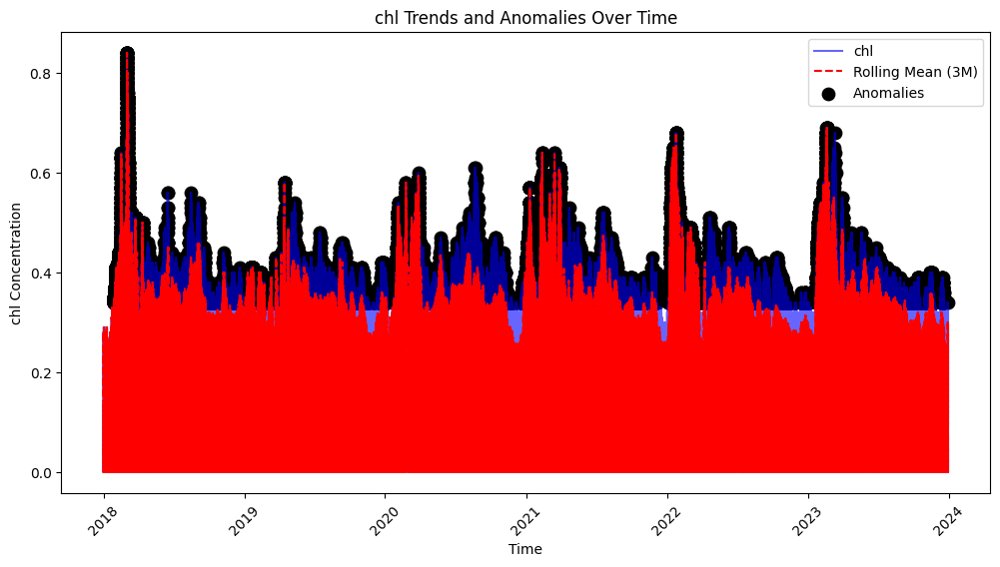

,chl
time,
2018-10-01,0.34
2018-10-01,0.35
2018-10-01,0.34
2018-10-01,0.34
2018-10-01,0.34
...,...
2023-09-28,0.34
2023-09-28,0.34
2023-09-28,0.34


In [17]:
# Computing rolling mean (3-month window)
df['chl_RollingMean'] = df['chl'].rolling(window=3, center=True).mean()

# Computing Z-scores for anomaly detection
chl_mean = df['chl'].mean()
chl_std = df['chl'].std()
df['chl_Zscore'] = (df['chl'] - chl_mean) / chl_std
df['Anomaly'] = df['chl_Zscore'].abs() > 2.5

# Plot rolling average and anomalies
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['chl'], label='chl', color='blue', alpha=0.6)
plt.plot(df.index, df['chl_RollingMean'], label='Rolling Mean (3M)', color='red', linestyle='dashed')
plt.scatter(df.index[df['Anomaly']], df['chl'][df['Anomaly']], color='black', label='Anomalies', marker='o', s=80)
plt.xlabel("Time")
plt.ylabel("chl Concentration")
plt.title("chl Trends and Anomalies Over Time")
plt.legend()
plt.xticks(rotation=45)
plt.show()

# Displaying anomalies
anomalies = df[df['Anomaly']][['chl']]
anomalies

The trends and anomalies in chlorophyll-a concentration reveal clear seasonal peaks and sporadic extreme events between 2018 and 2023. The rolling 3-month mean (red dashed line) highlights the underlying seasonal pattern, with recurrent increases corresponding to algal bloom periods. Several anomalies (black points), particularly during peak bloom seasons, indicate abrupt and unusually high chlorophyll-a concentrations, possibly driven by episodic nutrient influxes, stratification events, or climatic disturbances. The highest anomaly intensity occurs in early 2018 and again in 2023, suggesting interannual variability in bloom magnitude. Overall, these anomalies emphasize the influence of short-term environmental fluctuations superimposed on the regular seasonal bloom cycle.

# Correlation Analysis

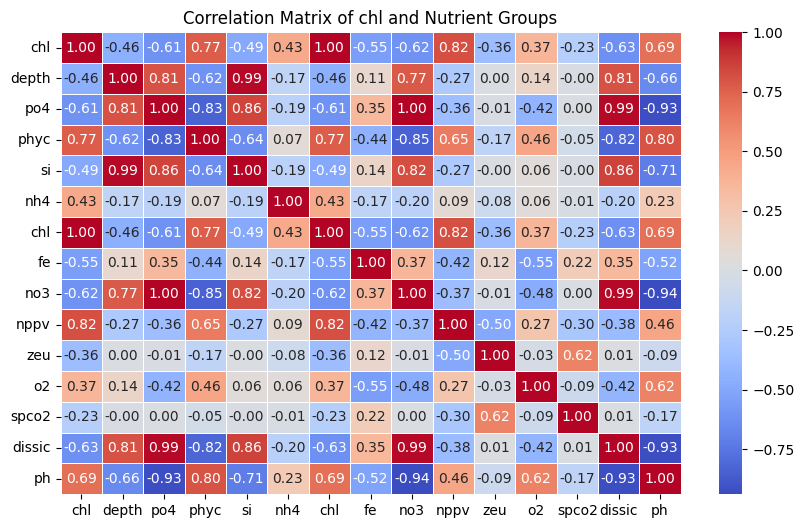

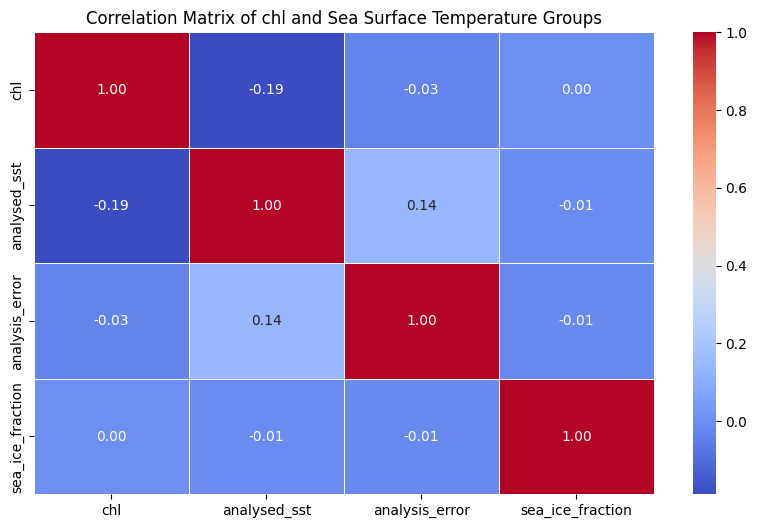

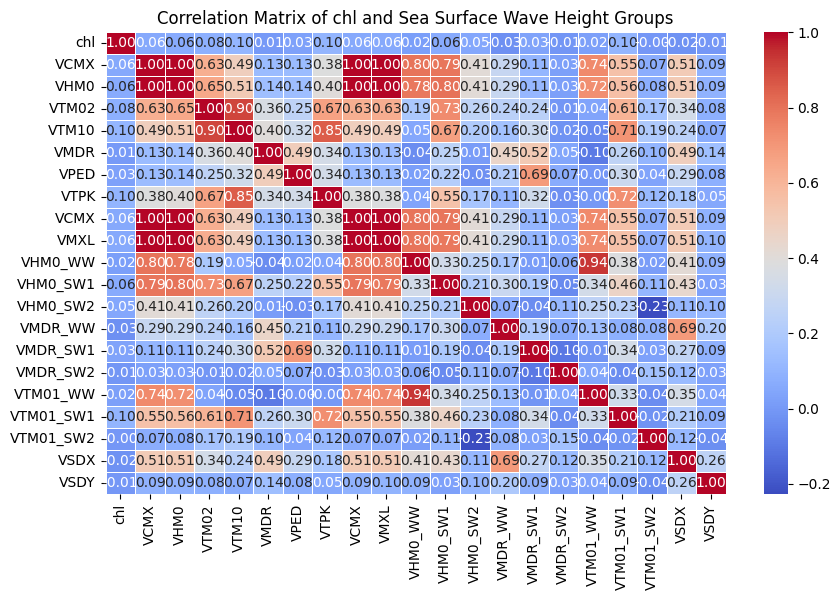

In [18]:
sst_columns = ['analysed_sst', 'analysis_error', 'sea_ice_fraction']
sswh_columns = ['VCMX', 'VHM0', 'VTM02', 'VTM10', 'VMDR', 'VPED', 'VTPK', 'VCMX', 'VMXL', 
                 'VHM0_WW', 'VHM0_SW1', 'VHM0_SW2', 'VMDR_WW', 'VMDR_SW1', 'VMDR_SW2', 
                 'VTM01_WW', 'VTM01_SW1', 'VTM01_SW2', 'VSDX', 'VSDY']

# Computing all correlation matrix
correlation_matrix_chl = df[['chl'] + nutrient_columns].corr()
correlation_matrix_sst = df[['chl'] + sst_columns].corr()
correlation_matrix_sswh = df[['chl'] + sswh_columns].corr()

# Plot heatmaps
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_chl, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of chl and Nutrient Groups")
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_sst, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of chl and Sea Surface Temperature Groups")
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_sswh, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of chl and Sea Surface Wave Height Groups")
plt.show()

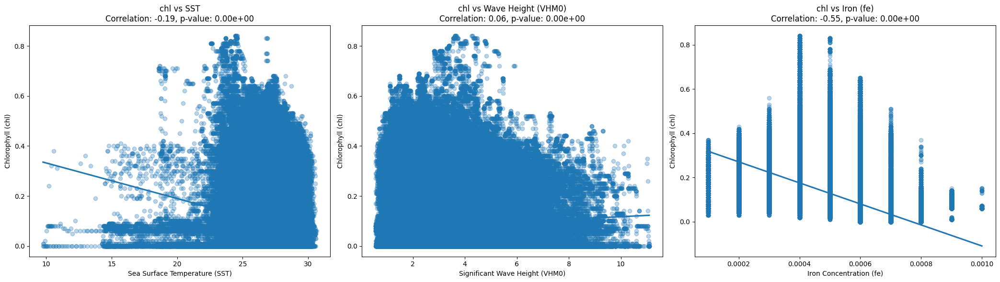

In [19]:
# https://www.geeksforgeeks.org/python-pearson-correlation-test-between-two-variables/
from scipy.stats import pearsonr

# Extract relevant columns
subset = df[['chl', 'analysed_sst', 'VHM0', 'fe']].dropna()

# Calculate correlation coefficients
corr_sst, pval_sst = pearsonr(subset['chl'], subset['analysed_sst'])
corr_vhm0, pval_vhm0 = pearsonr(subset['chl'], subset['VHM0'])
corr_fe, pval_fe = pearsonr(subset['chl'], subset['fe'])

# Plotting
plt.figure(figsize=(21, 6))

# chl vs SST
plt.subplot(1, 3, 1)
sns.regplot(x='analysed_sst', y='chl', data=subset, scatter_kws={'alpha':0.3})
plt.title(f'chl vs SST\nCorrelation: {corr_sst:.2f}, p-value: {pval_sst:.2e}')
plt.xlabel('Sea Surface Temperature (SST)')
plt.ylabel('Chlorophyll (chl)')

# chl vs VHM0
plt.subplot(1, 3, 2)
sns.regplot(x='VHM0', y='chl', data=subset, scatter_kws={'alpha':0.3})
plt.title(f'chl vs Wave Height (VHM0)\nCorrelation: {corr_vhm0:.2f}, p-value: {pval_vhm0:.2e}')
plt.xlabel('Significant Wave Height (VHM0)')
plt.ylabel('Chlorophyll (chl)')

# chl vs fe
plt.subplot(1, 3, 3)
sns.regplot(x='fe', y='chl', data=subset, scatter_kws={'alpha':0.3})
plt.title(f'chl vs Iron (fe)\nCorrelation: {corr_fe:.2f}, p-value: {pval_fe:.2e}')
plt.xlabel('Iron Concentration (fe)')
plt.ylabel('Chlorophyll (chl)')

plt.tight_layout()
plt.show()

#### Chlorophyll-a vs Sea Surface Temperature (SST)
- Correlation: -0.19 (weak negative)
- Higher SST values are slightly associated with lower chlorophyll-a concentrations.

Possible Cause: Elevated temperatures may enhance water stratification, reducing nutrient mixing from deeper layers, or push phytoplankton beyond their optimal thermal growth range.

#### Chlorophyll-a vs Significant Wave Height (VHM0)
- Correlation: 0.06 (very weak positive)
- Moderate wave activity has a slight positive effect on chlorophyll-a levels.

Possible Cause: Mild turbulence can enhance nutrient resuspension, promoting phytoplankton growth, but excessive turbulence likely disrupts bloom formation.

#### Chlorophyll-a vs Iron Concentration (Fe)
- Correlation: -0.55 (moderate negative)
- Higher iron concentrations correspond to lower chlorophyll-a levels.

Possible Cause: This may reflect post-bloom conditions, where iron accumulates after phytoplankton decline, or indicate oxidative stress or imbalanced nutrient ratios inhibiting growth.